In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import streamlit as st
import plotly.io as pio
from PIL import Image
from urllib import request
import json
import geopandas as gpd

In [2]:
logo = Image.open("C:/Users/Hp/Documents/Logo/logo.png")

In [3]:
def convert_mn_to_k(values):
    return [str(num/1000)+'k' for num in values]

## Small Savings

In [4]:
small_savings = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\SMALL_SAVINGS.xlsx',skiprows=3,usecols=['Year','Total','Unnamed: 9'])

In [5]:
small_savings_1 = small_savings.iloc[2:]

In [6]:
small_savings_1.columns = ['Year','Total Receipts','Total Outstandings']

In [7]:
small_savings_1['Total Receipts'] = small_savings_1['Total Receipts'].astype(float)
small_savings_1['Total Outstandings'] = small_savings_1['Total Outstandings'].astype(float)

small_savings_1['Year'] = small_savings_1['Year'].str.split('-',expand=True)[0]
small_savings_1 = small_savings_1.iloc[:39]

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\1141426567.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  small_savings_1['Total Receipts'] = small_savings_1['Total Receipts'].astype(float)
C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\1141426567.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  small_savings_1['Total Outstandings'] = small_savings_1['Total Outstandings'].astype(float)
C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\1141426567.py:4: SettingWithCopyWarning: 
A value is trying to be set

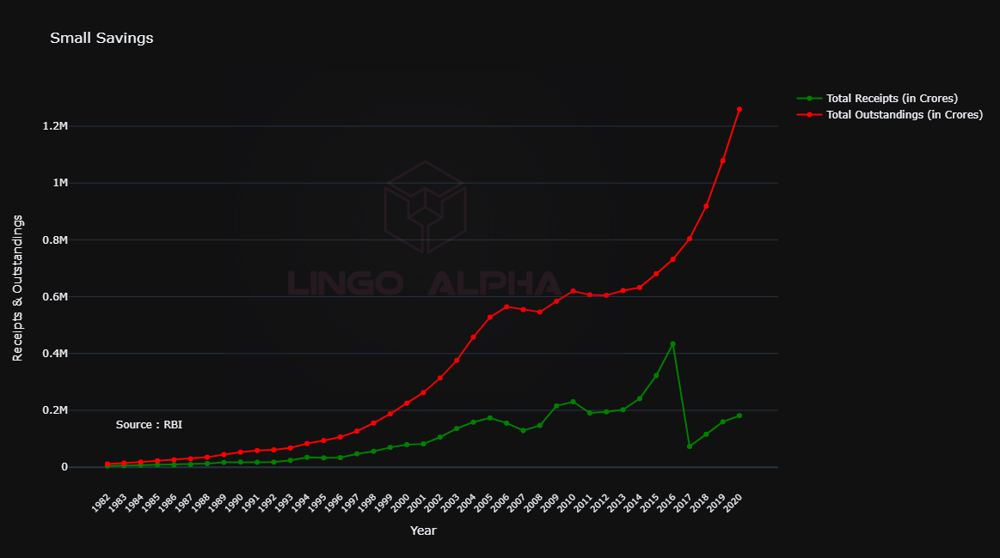

In [8]:
fig = make_subplots(rows=1,cols=1)

fig.add_trace(go.Scatter(x=small_savings_1['Year'],y=small_savings_1['Total Receipts'],marker={'color':'green'},name='Total Receipts (in Crores)',mode='lines+markers'),row=1,col=1)
fig.add_trace(go.Scatter(x=small_savings_1['Year'],y=small_savings_1['Total Outstandings'],marker={'color':'red'},name='Total Outstandings (in Crores)',mode='lines+markers'),row=1,col=1)
fig.update_xaxes(title_text="Year",showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10)
fig.update_yaxes(title_text="Receipts & Outstandings")

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Small Savings', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))   
fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=150000)

pio.write_image(fig, 'small_savings.png',scale=2, width=1120, height=820)

fig.show()              

## Components of Money Stock

In [9]:
money_stock = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\COMPONENTS_OF_MONEY_STOCK.xlsx',skiprows=3)

In [10]:
money_stock_1 = money_stock.iloc[1:].iloc[:54]

In [11]:
money_stock_1.columns

Index(['Unnamed: 0', 'Year', 'Currency in Circulation ', 'Cash with Banks ',
       'Currency with the Public (2-3) ', 'Other' Deposits with the RBI ',
       'Bankers' Deposits with the RBI ', 'Demand Deposits', 'Time Deposits',
       'Reserve Money (2+5+6)', 'Narrow Money (4+5+7)', 'Broad Money (8+10)'],
      dtype='object')

In [12]:
money_stock_1.drop('Unnamed: 0',axis=1,inplace=True)
money_stock_1.columns = ['Year','Currency in Circulation','Cash with Banks','Currency with the Public','Other Deposits with the RBI','Banker Deposits with the RBI','Demand Deposits','Time Deposits','Reserve Money','Narrow Money','Broad Money']

### Currency In Circulation

In [13]:
curr_circ = money_stock_1[['Year','Currency in Circulation']]
curr_circ['Year'] = curr_circ['Year'].str.split('-',expand=True)[0]

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\177836856.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



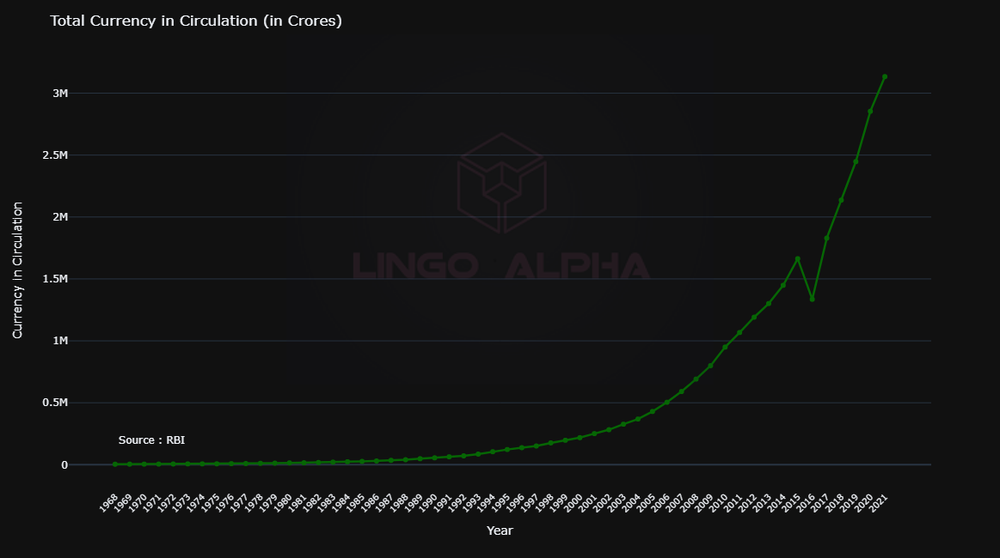

In [14]:
fig = px.line(curr_circ,x='Year',y='Currency in Circulation',markers=True)
fig.update_xaxes(showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10)
#fig.update_yaxes(ticktext=convert_mn_to_k(curr_circ['Currency in Circulation']))

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Total Currency in Circulation (in Crores)', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))
fig.update_traces(line_color='#066604', line_width=2.5)
fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=200000)

pio.write_image(fig, 'currency_in_circulation.png',scale=2, width=1120, height=820)

fig.show()

### Currency Circulation Breakdown

In [15]:
curr_circ_brk = money_stock_1[['Year','Cash with Banks','Currency with the Public']]

In [16]:
#curr_circ_brk = curr_circ_brk.iloc[23:]

In [17]:
curr_circ_brk['Year'] = curr_circ_brk['Year'].str.split('-',expand=True)[0]

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\3115022714.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



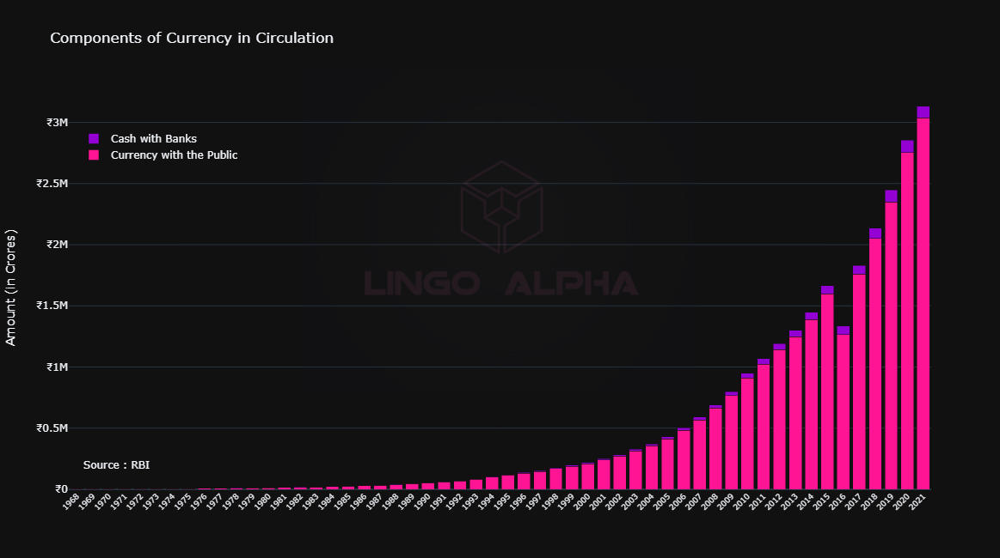

In [18]:

fig = go.Figure(data=[
    go.Bar(name='Currency with the Public', x=curr_circ_brk['Year'], y=curr_circ_brk['Currency with the Public'],marker={'color': 'deeppink'}),
    go.Bar(name='Cash with Banks', x=curr_circ_brk['Year'], y=curr_circ_brk['Cash with Banks'],marker={'color': 'darkviolet'})
])
# Change the bar mode
fig.update_layout(title='Components of Currency in Circulation', barmode='stack', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False),legend=dict(x=0.009,y=0.9))
fig.update_xaxes(gridwidth=1, tickangle=-45, tickfont_size=9)
fig.update_yaxes(tickprefix='₹',title='Amount (in Crores)')

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 
fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=200000)

pio.write_image(fig, 'components_currency_in_circulation.png',scale=2, width=1120, height=820)

fig.show()

### Reserve Money

In [19]:
reserve_money = money_stock_1[['Year','Reserve Money']]

In [20]:
reserve_money['Year'] = reserve_money['Year'].str.split('-',expand=True)[0]

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\4023924579.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



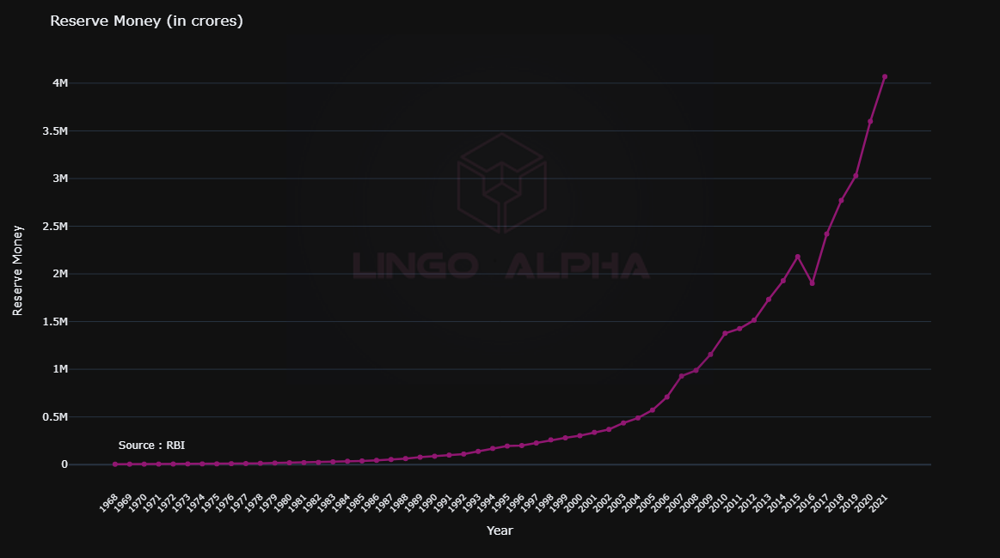

In [21]:
fig = px.line(reserve_money,x='Year',y='Reserve Money',markers=True)
fig.update_xaxes(showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10)
#fig.update_yaxes(ticktext=convert_mn_to_k(curr_circ['Currency in Circulation']))

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Reserve Money (in crores)', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))
fig.update_traces(line_color='#901771', line_width=2.5)
fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=200000)

pio.write_image(fig, 'reserve_money.png',scale=2, width=1120, height=820)

fig.show()

### Reserve Money constituents

In [22]:
reserve_money_constituents = money_stock_1[['Year','Currency in Circulation','Other Deposits with the RBI','Banker Deposits with the RBI','Reserve Money']]

In [23]:
reserve_money_constituents['Year'] = reserve_money_constituents['Year'].str.split('-',expand=True)[0]

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\1294392505.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



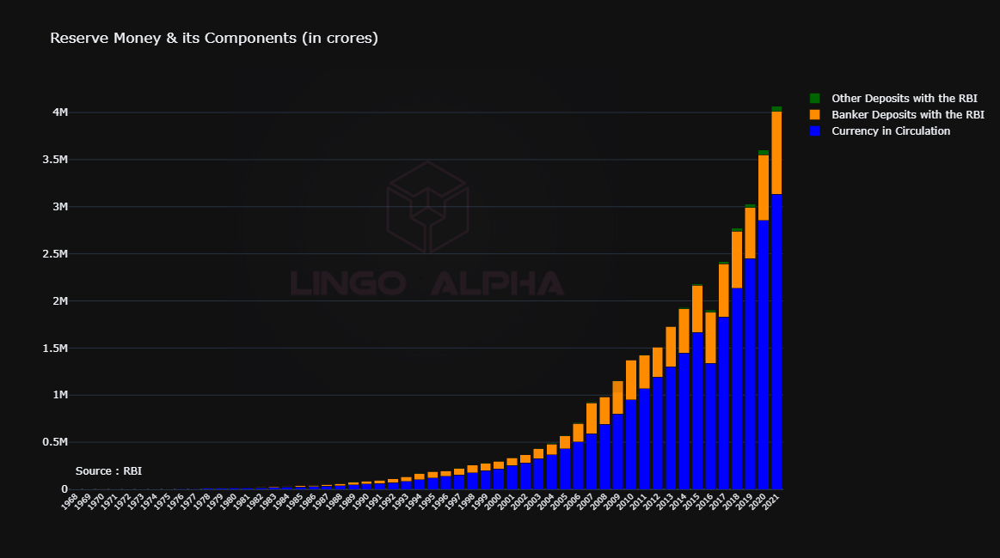

In [24]:
fig = go.Figure(data=[
    go.Bar(name='Currency in Circulation', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Currency in Circulation'],marker={'color': 'blue'}),
    go.Bar(name='Banker Deposits with the RBI', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Banker Deposits with the RBI'],marker={'color': 'darkorange'}),
    go.Bar(name='Other Deposits with the RBI', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Other Deposits with the RBI'],marker={'color': 'darkgreen'})
])
# Change the bar mode
fig.update_layout(title='Reserve Money & its Components (in crores)', barmode='stack', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))
fig.update_xaxes(gridwidth=1, tickangle=-45, tickfont_size=9)
fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=200000)

pio.write_image(fig, 'reserve_money_components.png',scale=2, width=1120, height=820)

fig.show()

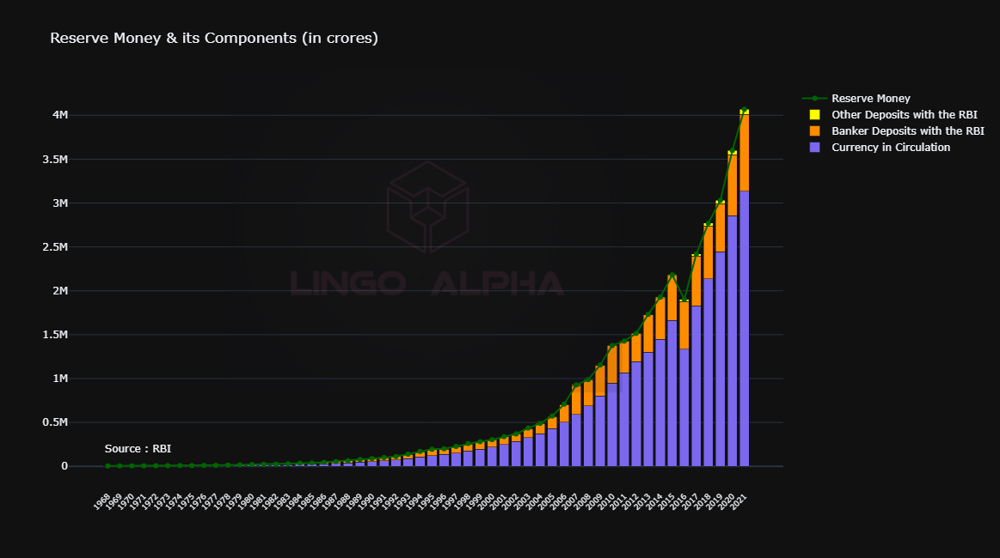

In [25]:
fig = go.Figure(data=[
    go.Bar(name='Currency in Circulation', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Currency in Circulation'],marker={'color': 'mediumslateblue'}),
    go.Bar(name='Banker Deposits with the RBI', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Banker Deposits with the RBI'],marker={'color': 'darkorange'}),
    go.Bar(name='Other Deposits with the RBI', x=reserve_money_constituents['Year'], y=reserve_money_constituents['Other Deposits with the RBI'],marker={'color': 'yellow'}),
    go.Scatter(name='Reserve Money',x=reserve_money_constituents['Year'],y=reserve_money_constituents['Reserve Money'],mode='lines+markers',marker={'color':'darkgreen'})
])
# Change the bar mode
fig.update_layout(title='Reserve Money & its Components (in crores)', barmode='stack', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))
fig.update_xaxes(gridwidth=1, tickangle=-45, tickfont_size=9)
fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.add_annotation(text="Source : RBI", align = 'center', showarrow=False, y=200000)

pio.write_image(fig, 'reserve_money_breakdown.png',scale=2, width=1120, height=820)

fig.show()

### Employment in organised sectors (Public + Private)

In [26]:
employed_organized_sectors = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\EMPLOYMENT_IN_PUBIC_AND_ORGANIZED_PRIVATE_SECTOR.xlsx',skiprows=3)

In [27]:
employed_organized_sectors = employed_organized_sectors[['Year','Number of Persons on the live register (end-December)']].iloc[1:39].reset_index(drop=True)
employed_organized_sectors['Year'] = employed_organized_sectors['Year'].str.split('-',expand=True)[0]
employed_organized_sectors['Year'] = employed_organized_sectors['Year'].astype(int)

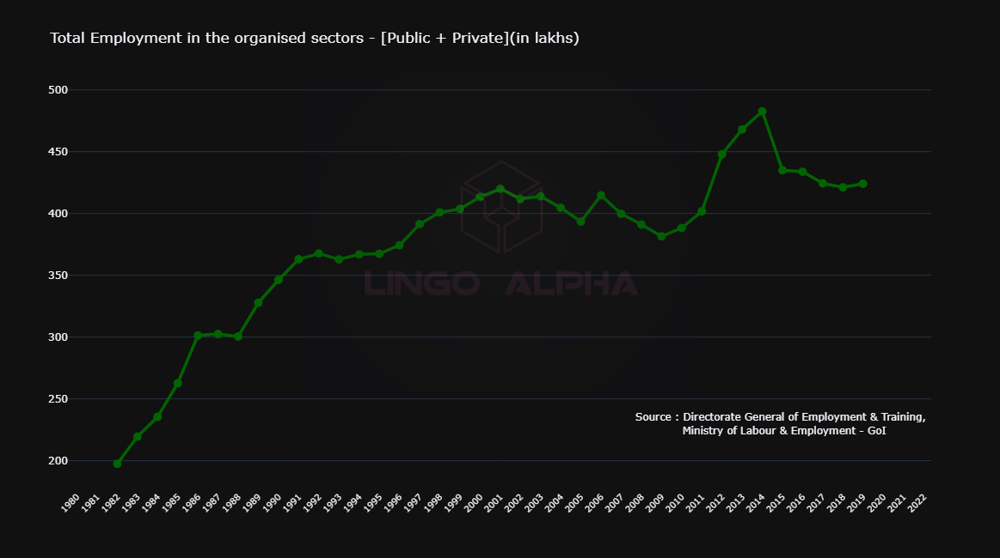

In [28]:
fig = go.Figure(data=[go.Scatter(x=employed_organized_sectors['Year'],y=employed_organized_sectors['Number of Persons on the live register (end-December)'],mode='lines+markers',marker={'size': 10,'color': 'darkgreen'},line=dict(color="darkgreen", width=3.5))])
fig.update_xaxes(showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10,tickmode='linear')

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Total Employment in the organised sectors - [Public + Private](in lakhs)', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False))
fig.add_annotation(text="Source : Directorate General of Employment & Training, <br> Ministry of Labour & Employment - GoI", align = 'center', showarrow=False, x=2015, y=230)

pio.write_image(fig, 'employment_organised_sectors.png',scale=2, width=1120, height=820)

fig.show()

### Central Government Fiscal deficit

In [29]:
central_govt_fiscal_deficit = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\MONTHLY_GROSS_FISCAL_DEFICIT_CENTRAL_GOVT.xlsx',skiprows=3)
central_govt_fiscal_deficit = central_govt_fiscal_deficit[['Month','2017-18','2018-19','2019-20','2020-21','2021-22','2022-23']].iloc[1:13].reset_index(drop=True)

In [30]:
central_govt_fiscal_deficit

,Month,2017-18,2018-19,2019-20,2020-21,2021-22,2022-23
0,April,205622.0,151967.0,157048.0,279512.0,78699.0,74846.0
1,May,167739.0,193526.0,209109.0,186831.0,44475.0,129075.0
2,June,68324.0,83540.0,65898.0,196020.0,151071.0,147950.0
3,July,63211.0,111224.0,115550.0,158986.0,46898.0,-11040.0
4,August,20149.0,51034.0,6235.0,48998.0,146866.0,NaN
5,September,-26107.0,3441.0,97714.0,43646.0,58842.0,NaN
6,October,26383.0,53851.0,68891.0,39161.0,20175.0,NaN
7,November,86784.0,68042.0,87389.0,122353.0,148588.0,NaN
8,December,8844.0,-15168.0,123891.0,82962.0,63752.0,NaN
9,January,55610.0,69388.0,53747.0,75535.0,178502.0,NaN


In [31]:
year_cols = central_govt_fiscal_deficit.columns[1:]
periods = []
fis_defs = []
for col in central_govt_fiscal_deficit.columns[1:]:
    period = np.where(central_govt_fiscal_deficit['Month'].isin(['Jan','Feb','Mar']),central_govt_fiscal_deficit['Month']+","+str(col.split('-')[1]),central_govt_fiscal_deficit['Month']+","+str(col.split('-')[0]))
    periods.append(period)

    fis_def = central_govt_fiscal_deficit[col]
    fis_defs.append(fis_def)

fiscal_deficit = pd.DataFrame({'Period':np.concatenate(periods),
               'Fiscal Deficit':np.concatenate(fis_defs)})

fiscal_deficit['Fiscal Deficit'] = fiscal_deficit['Fiscal Deficit'].astype(float)

In [32]:
fiscal_deficit

,Period,Fiscal Deficit
0,"April,2017",205622.0
1,"May,2017",167739.0
2,"June,2017",68324.0
3,"July,2017",63211.0
4,"August,2017",20149.0
...,...,...
67,"November,2022",NaN
68,"December,2022",NaN
69,"January,2022",NaN
70,"February,2022",NaN


In [33]:
fiscal_deficit=fiscal_deficit.dropna()
fiscal_deficit['year'] = fiscal_deficit['Period'].str.split(',',expand=True)[1]
fiscal_deficit['month'] = fiscal_deficit['Period'].str.split(',',expand=True)[0]

fiscal_deficit['year'] = fiscal_deficit['year'].astype(int)
fiscal_deficit['Date'] = pd.to_datetime([f'{y}-{m}-01' for y, m in zip(fiscal_deficit.year, fiscal_deficit.month)])

fiscal_deficit = fiscal_deficit.drop(columns=['year','month'])
fiscal_deficit = fiscal_deficit.sort_values('Date')

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\2403030290.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\2403030290.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\2403030290.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/st

In [34]:
fiscal_deficit = fiscal_deficit.reset_index(drop=True)

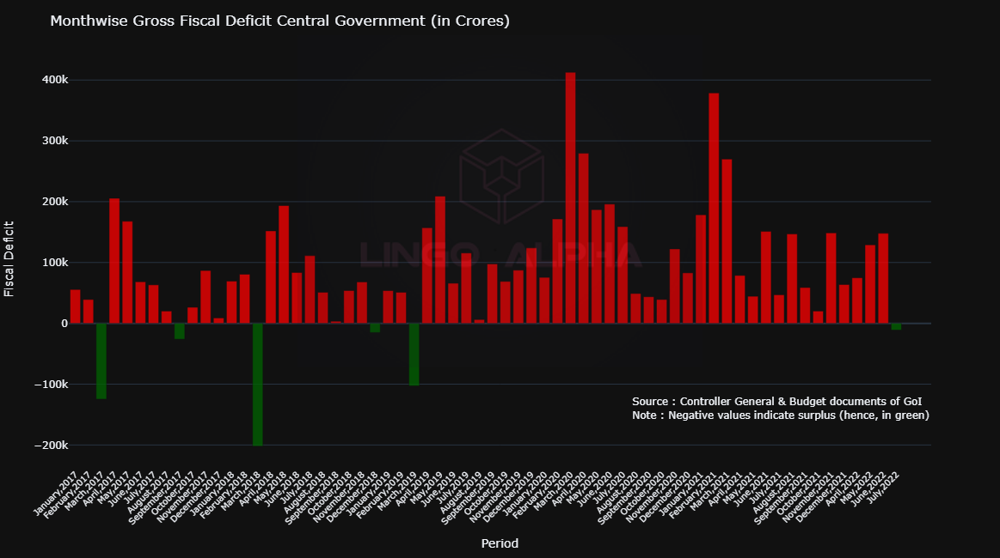

In [35]:
fiscal_deficit["Color"] = np.where(fiscal_deficit['Fiscal Deficit']<0, 'darkgreen', 'red')


fig = px.bar(fiscal_deficit, x=fiscal_deficit['Period'], y=fiscal_deficit['Fiscal Deficit'], color=fiscal_deficit['Period'], color_discrete_sequence=fiscal_deficit["Color"], opacity=0.75)
fig.update_xaxes(showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10)

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Monthwise Gross Fiscal Deficit Central Government (in Crores)', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False),showlegend=False)
fig.add_annotation(text="Source : Controller General & Budget documents of GoI <br> Note : Negative values indicate surplus (hence, in green)", align = 'center', showarrow=False, x='July,2021', y=-140000)

pio.write_image(fig, 'fiscal_deficit_dentral_govt.png',scale=2, width=1120, height=820)

fig.show()



### Per Capita States Net GDP

In [36]:
state_gdp = pd.DataFrame() 
for sht_num in [0,1,2]:
    df = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\PER_CAPITA_NET_STATE_PRODUCT_CONSTANT_PRICES.xlsx',skiprows=3,sheet_name=sht_num)
    state_gdp = pd.concat(objs=[state_gdp,df],axis=1)

In [37]:
national_per_capita_gdp = state_gdp[['State / Union Territory','All-India per capita NNI']]
state_gdp = state_gdp.drop(columns=['Unnamed: 0','All-India per capita NNI'])

In [38]:
state_gdp = state_gdp.iloc[1:32]

In [39]:
state_gdp_20 = state_gdp.iloc[29]

In [40]:
state_gdp_20 = pd.DataFrame(state_gdp_20).T.drop('State / Union Territory',axis=1)

In [41]:
state_gdp_20 = state_gdp_20.T.reset_index()

In [42]:
state_gdp_20.columns=['ST_NM','GDP']

In [43]:
url = "https://gist.githubusercontent.com/jbrobst/56c13bbbf9d97d187fea01ca62ea5112/raw/e388c4cae20aa53cb5090210a42ebb9b765c0a36/india_states.geojson"
with request.urlopen(url) as f:
    geo_india = json.load(f)

In [44]:
df = gpd.read_file(url)

In [45]:
state_gdp_2020 = pd.merge(df,state_gdp_20,on='ST_NM')

In [46]:
state_gdp_2020["lon"] = state_gdp_2020["geometry"].centroid.x
state_gdp_2020["lat"] = state_gdp_2020["geometry"].centroid.y
state_gdp_2020["GDP"] = state_gdp_2020["GDP"]

state_gdp_2020['lat'].iloc[18] = 33.2778
state_gdp_2020['lon'].iloc[18] = 75.3412

C:\Users\Hp\anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



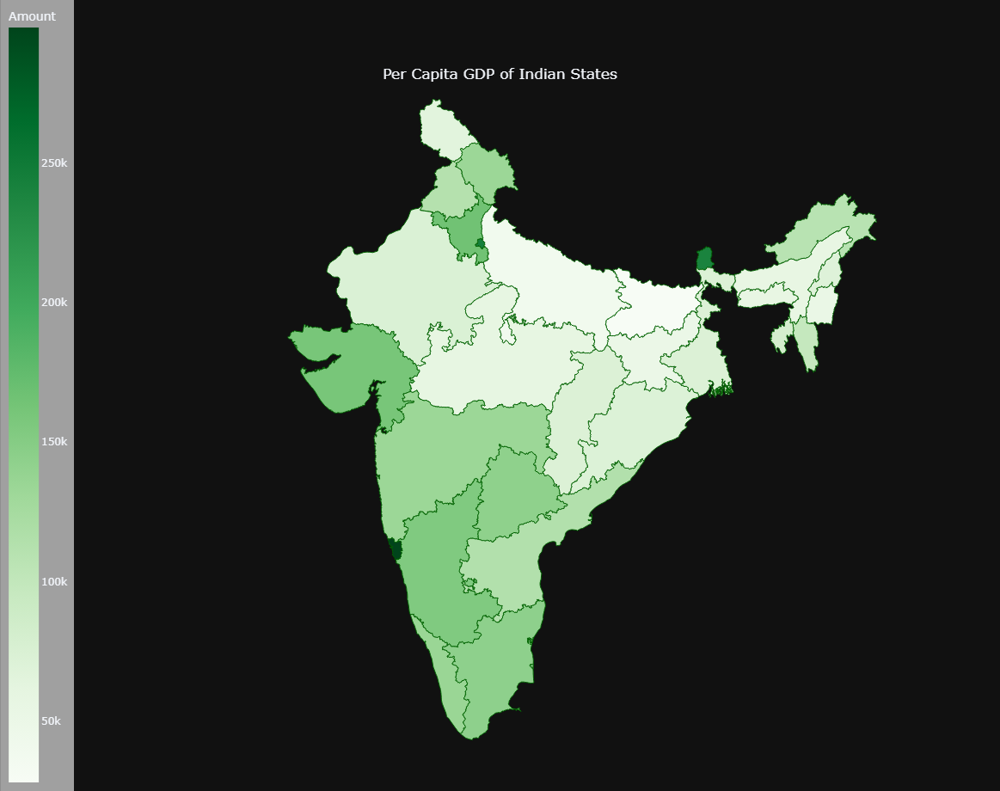

In [47]:

fig = go.Figure(data=go.Choropleth(
    geojson=geo_india,
    featureidkey='properties.ST_NM',
    #locationmode='geojson-id',
    locations=state_gdp_2020['ST_NM'].str.title(), # To make lower case to CamelCase
    z=state_gdp_2020['GDP'],
    text= state_gdp_2020['ST_NM'].str.title(),
    autocolorscale=False,
    colorscale='Greens',
    marker_line_color='darkgreen',

    colorbar=dict(
        title={'text': "Amount"},
        thickness=35,
        len=1.0,
        bgcolor='rgba(255,255,255,0.6)',

        xanchor='right',
        x=0.0,
        yanchor='bottom',
        y=0.0
    )
))

fig.update_geos(
    visible=False,
    projection=dict(
        type='conic conformal',
        parallels=[12.472944444, 35.172805555556],
        rotation={'lat': 24, 'lon': 80}
    ),
    lonaxis={'range': [68, 98]},
    lataxis={'range': [6, 38]}
)

fig.add_trace(go.Scattergeo(
    lon=state_gdp_2020['lon'],
    lat=state_gdp_2020['lat'],
    mode='text',
    #text=df['ST_NM'].str.title(),
    #text=['{}<br>{}'.format(k,v) for k,v in zip(state_gdp_2020['ST_NM'].str.title(), state_gdp_2020['GDP'])],
    #textfont={'color': 'Green'},
    name=''
))

fig.update_layout(
    title=dict(
        text="Per Capita GDP of Indian States ",
        xanchor='center',
        x=0.5,
        yref='paper',
        yanchor='bottom',
        y=0.9,
        pad={'b': 0}
    ),
    margin={'r': 0, 't': 0, 'l': 0, 'b': 0},
    height=920,
    width=920,
    template = 'plotly_dark')

fig.show()


### Consumer Price Index (CPI)

In [48]:
cpi_annual = pd.read_excel(r'C:\Users\Hp\Documents\INDIA_ECONOMY_DEMOGRAPHY_DATA\ECONOMY\CONSUMER_PRICE_INDEX_ANNUAL_VARIATION.xlsx',skiprows=3)

In [49]:
cpi_annual_comb = cpi_annual.iloc[16:22]

In [50]:
cpi_annual_comb.columns = cpi_annual_comb.columns.str.replace('.','').str.replace(' ','')

C:\Users\Hp\AppData\Local\Temp\ipykernel_17644\3328103216.py:1: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



In [51]:
cpi_annual_comb.columns

Index(['Unnamed:0', 'Year/Month', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep',
       'Oct', 'Nov', 'Dec', 'Jan', 'Feb', 'Mar'],
      dtype='object')

In [52]:
cpi_annual_comb.T.reset_index().iloc[1]

index    Year/Month
16          2017-18
17          2018-19
18          2019-20
19          2020-21
20          2021-22
21          2022-23
Name: 1, dtype: object

In [53]:
cpi_annual_comb=cpi_annual_comb.T

In [54]:
cpi_annual_comb = pd.DataFrame(cpi_annual_comb).iloc[2:].reset_index()

In [55]:
cpi_annual_comb.columns = ['Month','2017-18','2018-19','2019-20','2020-21','2021-22','2022-23']

In [56]:
cpi_annual_comb.iloc[:,1:] = cpi_annual_comb.iloc[:,1:].replace('\*','',regex=True).replace('.',np.NaN).astype(float)

In [57]:
year_cols = cpi_annual_comb.columns[1:]
periods = []
cpis = []
for col in cpi_annual_comb.columns[1:]:
    period = np.where(cpi_annual_comb['Month'].isin(['Jan','Feb','Mar']),cpi_annual_comb['Month']+","+str(col.split('-')[1]),cpi_annual_comb['Month']+","+str(col.split('-')[0]))
    periods.append(period)

    cpi = cpi_annual_comb[col]
    cpis.append(cpi)

cpi_combined = pd.DataFrame({'Period':np.concatenate(periods),
               'CPI':np.concatenate(cpis)})

cpi_combined['CPI'] = cpi_combined['CPI'].astype(float)

In [58]:
cpi_combined = cpi_combined.dropna()
cpi_combined['year'] = cpi_combined['Period'].str.split(',',expand=True)[1]
cpi_combined['month'] = cpi_combined['Period'].str.split(',',expand=True)[0]

cpi_combined['year'] = cpi_combined['year'].astype(int)

cpi_combined['year'] = cpi_combined['year'].replace({18:2018,
                                                     19:2019,
                                                     20:2020,
                                                     21:2021,
                                                     22:2022})

cpi_combined['Date'] = pd.to_datetime([f'{y}-{m}-01' for y, m in zip(cpi_combined.year, cpi_combined.month)])

cpi_combined = cpi_combined.drop(columns=['year','month'])
cpi_combined = cpi_combined.sort_values('Date')

In [59]:
cpi_combined['CPI'].mean()

4.85

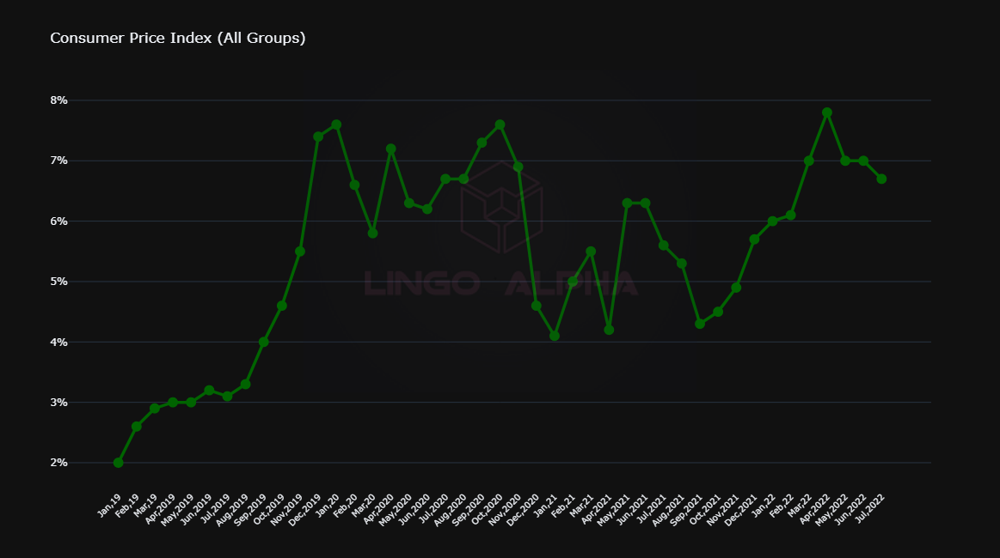

In [60]:
fig = go.Figure(data=[go.Scatter(x=cpi_combined.iloc[21:]['Period'],y=cpi_combined.iloc[21:]['CPI']
                                 ,marker={'size': 12,'color': 'darkgreen'},line=dict(color="darkgreen", width=3.5)
                                 ,mode='lines+markers')])

fig.update_xaxes(showgrid=True, gridwidth=1, tickangle=-45, tickfont_size=10)
fig.update_yaxes(ticksuffix='%')

fig.add_layout_image(
    dict(
        source=logo,
        xref="paper", yref="paper",
        x=0.5, y=0.24,
        sizex=0.8, sizey=0.8,
        xanchor="center",
        yanchor="bottom",
        opacity=0.1
    )
) 

fig.update_layout(title='Consumer Price Index (All Groups)', height=650, width=1150, template = 'plotly_dark', xaxis=dict(showgrid=False),showlegend=False)
#fig.add_annotation(text="Source : Controller General & Budget documents of GoI <br> Note : Negative values indicate surplus (hence, in green)", align = 'center', showarrow=False, x='July,2021', y=-140000)

#pio.write_image(fig, 'fiscal_deficit_dentral_govt.png',scale=2, width=1120, height=820)

fig.show()



### Wholesale Price Index 